In [1]:
run '../__init__.py'

In [2]:
import scipy.io as sio
from sodapy import Socrata

In [3]:
APP_TOKEN = os.getenv("APP_TOKEN")
client = Socrata("data.cityofnewyork.us", APP_TOKEN, timeout=3600)

# Automated Traffic Volume Counts

https://data.cityofnewyork.us/Transportation/Automated-Traffic-Volume-Counts/7ym2-wayt

New York City Department of Transportation (NYC DOT) uses Automated Traffic Recorders (ATR) to collect traffic (vehicle) volume counts throughout the five boroughs. The data covers the NYC DOT Sub-Regional Count Report areas which includes the East River Bridges, Manhattan Central Business District Crossings and Screenline (county line) Counts. This data is collected by placing sensors, ATRs, on streets to collect traffic volume counts and it is used to analyze peak and off-peak traffic volume counts. Each record represents traffic volume counts collected at a fifteen (15) minute increment.

In [4]:
endpoint = "7ym2-wayt"

In [5]:
query = "SELECT COUNT(*)"
NUM_RECORDS = int(client.get(endpoint, query=query)[0]['COUNT'])
NUM_RECORDS

27414481

## Aggregate Counts

In [6]:
df_dict = {}
for field in tqdm(['boro', 'yr', 'street', 'SegmentId', 'Direction', 'requestid']):
    query = f"""
        SELECT
            {field}, COUNT(*) as frequency, COUNT(*) / SUM(COUNT(*)) over () AS fraction
        GROUP BY {field}
        ORDER BY frequency DESC
        LIMIT {NUM_RECORDS}
    """
    df_dict[field] = pd.DataFrame.from_records(client.get(endpoint, query=query))

  0%|          | 0/6 [00:00<?, ?it/s]

In [7]:
df_dict['boro']

,boro,frequency,fraction
0,Brooklyn,8084048,0.29488240174964464948
1,Queens,7079204,0.25822863471316491456
2,Manhattan,6127170,0.22350122185424557189
3,Bronx,4556985,0.16622547040011445046
4,Staten Island,1567074,0.05716227128283041361


In [8]:
px.bar(df_dict['yr'].astype(float), x='yr', y='frequency')

**Daily Counts by Borough**

In [9]:
query = f"""
    SELECT
        boro, yr, m, d, hh, mm, COUNT(*) as frequency, SUM(vol) AS total_vol
    GROUP BY boro, yr, m, d, hh, mm
    ORDER BY yr, m, d, hh, mm
    LIMIT {NUM_RECORDS}
"""
df_dict['vol'] = pd.DataFrame.from_records(client.get(endpoint, query=query))

In [10]:
df = df_dict['vol']

df['ts'] = pd.to_datetime(df[['yr', 'm', 'd', 'hh', 'mm']]\
             .apply(lambda row: '-'.join(row), axis=1), format='%Y-%m-%d-%H-%M')
df = df.astype({'frequency':float, 'total_vol':float})

In [11]:
px.line(df.groupby([pd.Grouper(key='ts', freq='D'), 'boro']).total_vol.sum().reset_index(),
        x='ts', y='total_vol', color='boro')

## Case Studies

In [55]:
def request_atr_series(ids):
    
    # query = f"""
    #     SELECT *
    #     WHERE segmentid IN ({', '.join(map(str, ids))})
    #     AND yr = 2019
    #     LIMIT {NUM_RECORDS}
    # """
    
    query = f"""
        SELECT *
        WHERE segmentid IN ({', '.join(map(str, ids))})
        LIMIT {NUM_RECORDS}
    """    
    
    df = pd.DataFrame.from_records(client.get(endpoint, query=query))

    df['ts'] = pd.to_datetime(df[['yr', 'm', 'd', 'hh', 'mm']]\
                 .apply(lambda row: '-'.join(row), axis=1), format='%Y-%m-%d-%H-%M')
    df = df.astype({'vol':float})   
    
    
    gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df.wktgeom, crs="ESRI:102718")).drop(columns=['wktgeom'])
    gdf = gdf.to_crs(4326)
    
    return gdf

#### Grand & Clinton
**Rejected**

In [13]:
df = request_atr_series([24548, 32851])
px.line(df, x='ts', y='vol', color='segmentid', line_shape='hv')

In [14]:
df.groupby(['fromst', 'tost', 'street', 'direction']).size()

fromst           tost            street        direction
Attorney Street  Clinton Street  GRAND STREET  WB           672
Dead End         Pitt Street     GRAND STREET  EB           672
dtype: int64

#### Avenue D & 10th
**Rejected**

In [15]:
df = request_atr_series([9005742])
px.line(df, x='ts', y='vol', color='direction', line_shape='hv')

In [16]:
df.groupby(['fromst', 'tost', 'street', 'direction']).size()

fromst    tost            street    direction
Dead End  East 10 Street  AVENUE D  NB           1440
                                    SB           1440
dtype: int64

#### 43rd & 2nd

In [17]:
# df = request_atr_series([29461, 29986, 31152])

In [18]:
# px.line(df, x='ts', y='vol', color='street')

#### Catherine & Monroe

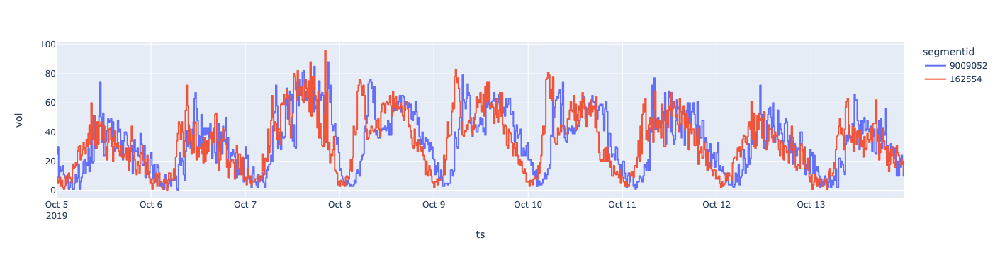

In [19]:
df = request_atr_series([9009052, 162554])
df = df.sort_values(by='ts')
px.line(df, x='ts', y='vol', color='segmentid', line_shape='hv')

In [20]:
df.groupby(['fromst', 'tost', 'street', 'direction']).size()

fromst          tost            street            direction
Catherine Slip  Dead end        CHERRY STREET     SB           864
Dead End        Catherine Slip  CATHERINE STREET  SB           864
dtype: int64

In [21]:
backlog = df.copy()
backlog.loc[backlog.segmentid=='9009052', 'vol'] *= -1
backlog['vol'] = backlog.vol.cumsum()
backlog['segmentid'] = 'backlog'

In [22]:
# backlog.groupby('ts').vol.sum().cumsum()

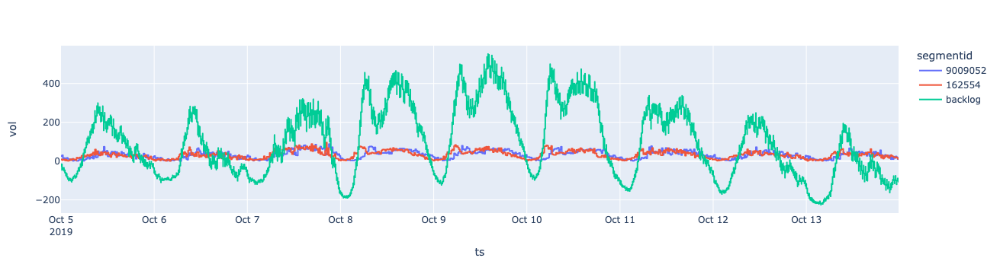

In [23]:
px.line(pd.concat([df, backlog]), x='ts', y='vol', color='segmentid', line_shape='hv')

#### Washington Heights

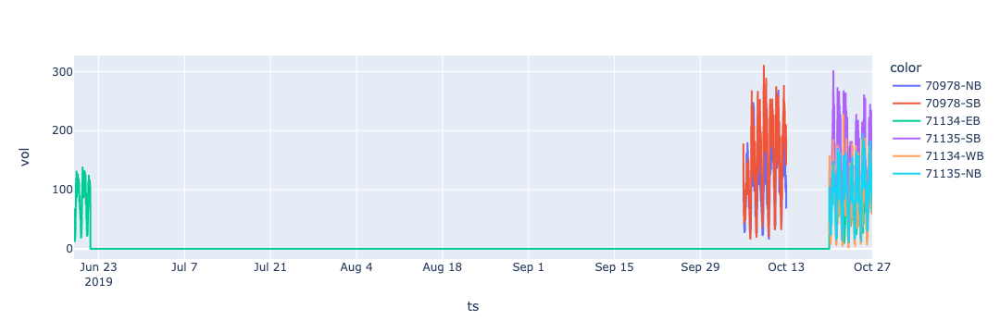

In [39]:
df = request_atr_series([71134, 71135, 70978])
df['color'] = df.segmentid + '-' + df.direction
px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

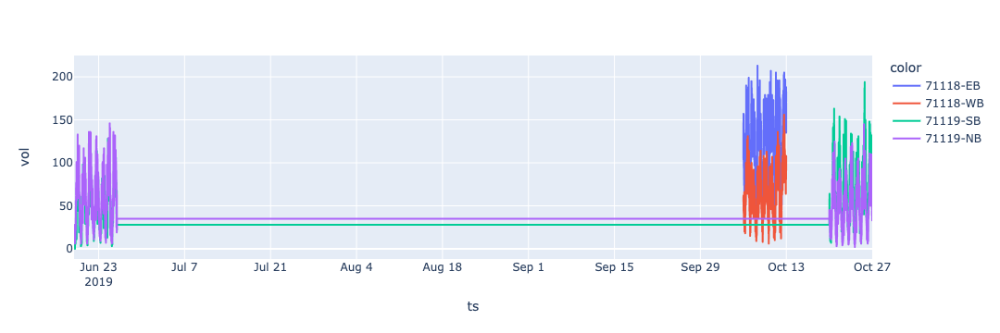

In [40]:
df = request_atr_series([71118, 71119])
df['color'] = df.segmentid + '-' + df.direction
px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

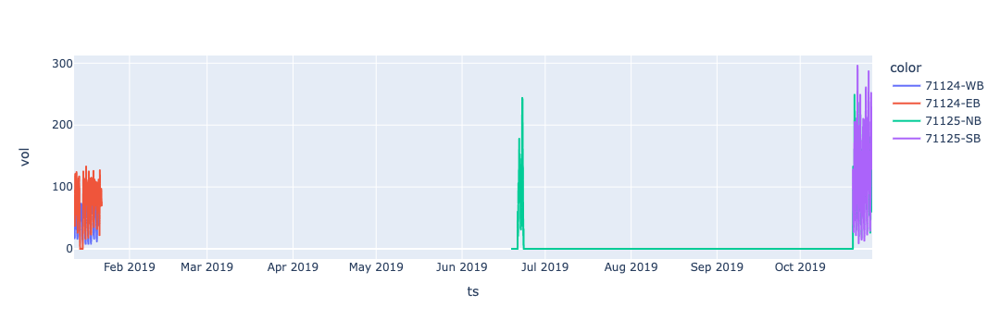

In [41]:
df = request_atr_series([71125, 71124])
df['color'] = df.segmentid + '-' + df.direction
px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

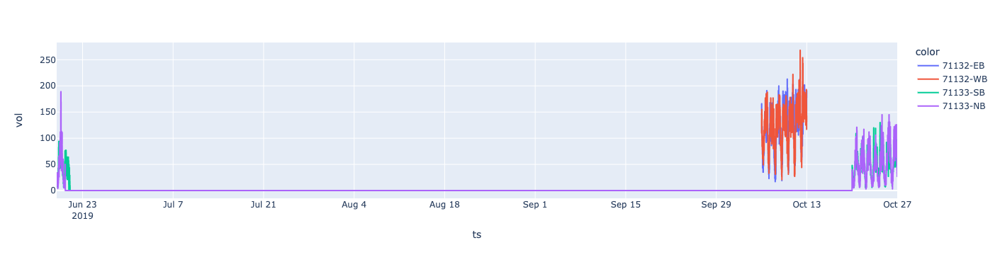

In [42]:
df = request_atr_series([71133, 71132])
df['color'] = df.segmentid + '-' + df.direction
px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

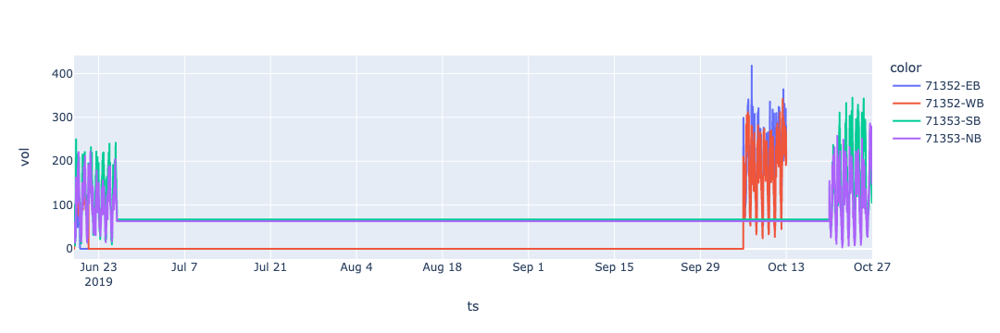

In [43]:
df = request_atr_series([71353, 71352])
df['color'] = df.segmentid + '-' + df.direction
px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

In [ ]:
# ALL TOGETHER NOW

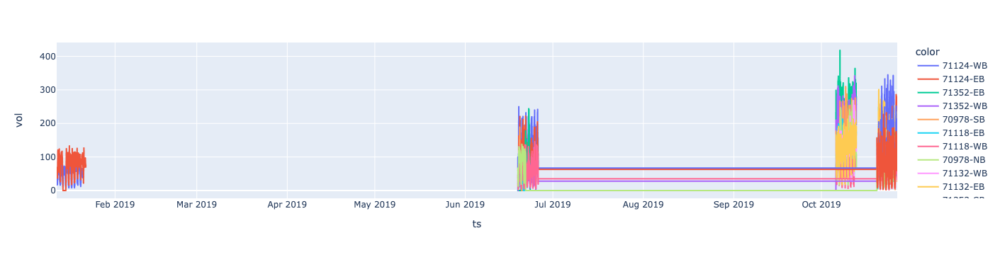

In [46]:
df = request_atr_series([71134, 71135, 70978, 71118, 71119, 71125, 71124, 71133, 71132, 71353, 71352])
df['color'] = df.segmentid + '-' + df.direction
px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

In [47]:
df.groupby(['fromst', 'tost', 'street', 'direction']).size()

fromst                   tost                     street              direction
Amsterdam Avenue         Audubon Avenue           WEST 181 STREET     EB           1344
                                                                      WB           1344
Audubon Avenue           Broadway/ 7 Avenue Line  WEST 181 STREET     EB            672
                                                                      WB            672
Broadway                 Bennett Avenue           WEST 181 STREET     EB           1344
                                                                      WB            672
Broadway/ 7 Avenue Line  Broadway/ 7 Avenue Line  ST NICHOLAS AVENUE  NB           1344
                                                                      SB            672
                         Wadsworth Avenue         WEST 181 STREET     EB            960
                                                                      WB            864
Wadsworth Avenue         Broadway       

#### Fort Greene

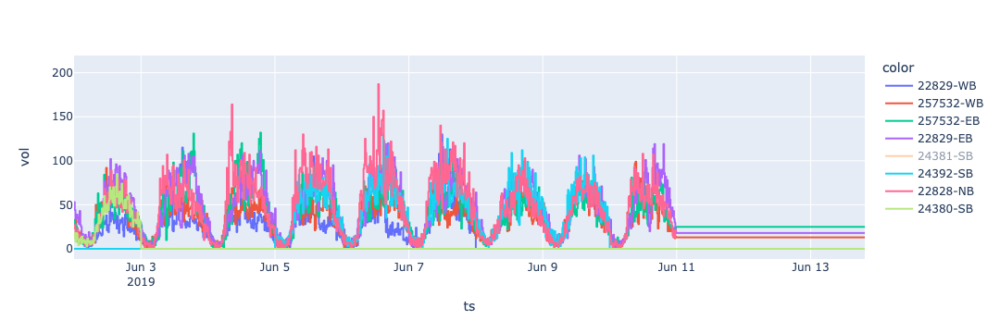

In [54]:
df = request_atr_series([24381, 24380, 257532, 24392, 22828, 22829])
# 24379
df['color'] = df.segmentid + '-' + df.direction
px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

#### Chelsea

In [ ]:
# df = request_atr_series([24381, 24380, 257532, 24392, 22828, 22829])
# # 24379
# df['color'] = df.segmentid + '-' + df.direction
# px.line(df, x='ts', y='vol', color='color', line_shape='hv', hover_data=['segmentid'])

## Creating a ArcGIS Layer

In [33]:
query = f"""
    SELECT wktgeom, yr, segmentid, requestid, direction,
        COUNT(*) AS num_records, COUNT(DISTINCT requestid) AS num_requests, SUM(vol) AS total_vol
    GROUP BY wktgeom, yr, segmentid, requestid, direction
    LIMIT {NUM_RECORDS}
"""
df = pd.DataFrame.from_records(client.get(endpoint, query=query))

In [34]:
df.shape

(29296, 8)

In [36]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df.wktgeom, crs="ESRI:102718")).drop(columns=['wktgeom'])
gdf = gdf.to_crs(4326)
gdf.geometry.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

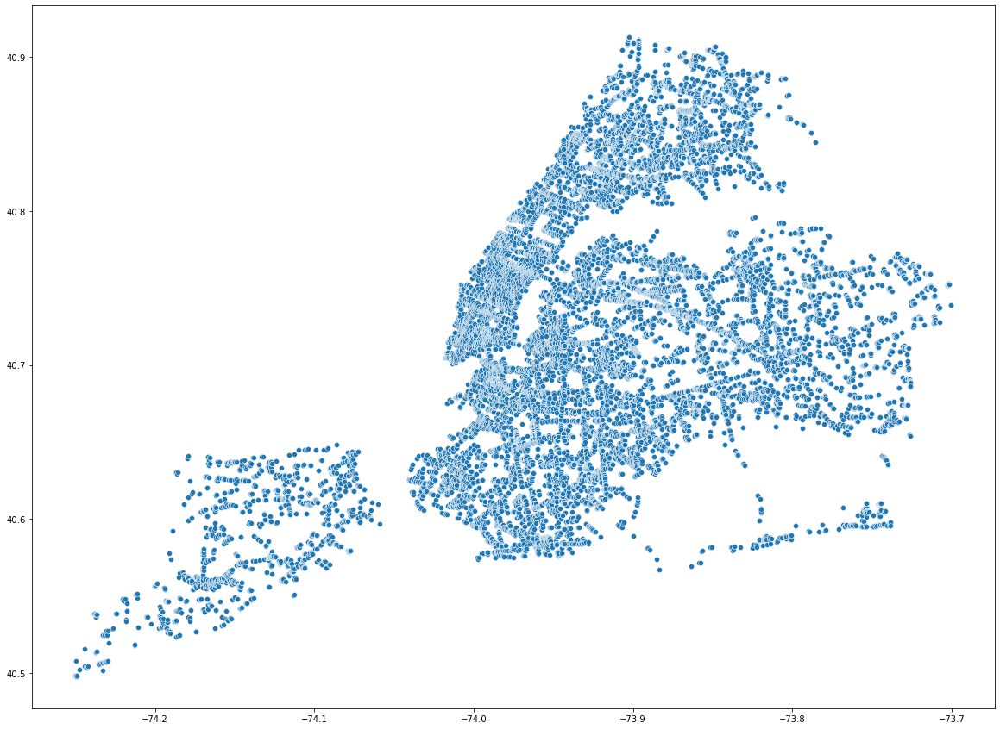

In [37]:
plt.figure(figsize=(20, 15))
sns.scatterplot(x=gdf.geometry.x, y=gdf.geometry.y)

In [38]:
# gdf.to_file(f"data_transformed/ATR_locations.shp")

/var/folders/42/qlm4zcmj6jb69bb7c3htqswc0000gn/T/ipykernel_38099/1657994811.py:1: UserWarning:

Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.



# Hyperlocal Temperature Monitoring

In [20]:
temp = pd.read_csv('../../data/Hyperlocal_Temperature_Monitoring.csv')

In [21]:
temp = temp.groupby(['Year', 'Longitude', 'Latitude']).agg({'Sensor.ID':pd.Series.mode, 'AirTemp':'mean', 'Day':'count',
                                                     'Install.Type':pd.Series.mode}).reset_index()

In [22]:
temp = gpd.GeoDataFrame(temp, geometry=gpd.points_from_xy(temp.Longitude, temp.Latitude, crs=4326))
temp.geometry.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
temp

,Year,Longitude,Latitude,Sensor.ID,AirTemp,Day,Install.Type,geometry
0,2018,-73.952411,40.649240,Bk-EF_08,76.936837,2948,Light Pole,POINT (-73.95241 40.64924)
1,2018,-73.952326,40.803959,M-CH_17,76.238127,2948,Street Tree,POINT (-73.95233 40.80396)
2,2018,-73.952225,40.647588,Bk-EF_05,76.044275,2948,Street Tree,POINT (-73.95222 40.64759)
3,2018,-73.952200,40.808560,M-CH_33,76.717871,2948,Street Tree,POINT (-73.95220 40.80856)
4,2018,-73.952100,40.805510,M-CH_03,76.085085,2948,Street Tree,POINT (-73.95210 40.80551)
...,...,...,...,...,...,...,...,...
707,2019,-73.738654,40.705592,Q-CH_06,74.218076,2948,Street Tree,POINT (-73.73865 40.70559)
708,2019,-73.738153,40.702333,Q-CH_25,74.546025,2948,Street Tree,POINT (-73.73815 40.70233)
709,2019,-73.737450,40.701176,Q-CH_04,74.069840,2948,Street Tree,POINT (-73.73745 40.70118)
710,2019,-73.737085,40.703231,Q-CH_02,75.484451,2948,Street Tree,POINT (-73.73708 40.70323)


In [24]:
# temp.to_file("data_transformed/hyperlocal_temperature_sensors.shp")

# UCI Data

In [25]:
data = sio.loadmat('../../data/Traffic Flow Prediction/traffic_dataset.mat')

In [26]:
data['tra_X_tr'][0][0].todense()

matrix([[0.09248015, 0.09668379, 0.07006072, ..., 0.        , 0.        ,
         0.        ],
        [0.09715086, 0.10228865, 0.08173751, ..., 0.        , 0.        ,
         0.        ],
        [0.11536665, 0.11069594, 0.10555815, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.06772536, 0.08173751, 0.06118636, ..., 0.        , 0.        ,
         1.        ],
        [0.09388136, 0.11069594, 0.08827651, ..., 0.        , 0.        ,
         1.        ],
        [0.08313872, 0.06679122, 0.06725829, ..., 0.        , 1.        ,
         0.        ]])